In [21]:
# %load_ext autoreload
# %autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [22]:
import pandas as pd

from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.metrics import roc_auc_score, r2_score
from sklearn.model_selection import train_test_split

from mlxtend.feature_selection import SequentialFeatureSelector as SFS

import sweetviz as sv   #analyzing the dataset

# importing
from helper_fe_v2 import (
            get_full_datapath_nm,
            read_df_from_file,
            yaml_path,
            check_module_members,
            read_yaml_conf
)

In [23]:
# Read in the YAML file

config = read_yaml_conf(yaml_path())
print ("yaml_ conf ", config ) 

yaml_ conf  {'write_file': True, 'base_dir': 'C:\\Users\\Arindam Banerji\\CopyFolder\\IOT_thoughts\\python-projects\\kaggle_experiments', 'full_config_file': 'C:\\Users\\Arindam Banerji\\CopyFolder\\IOT_thoughts\\python-projects\\kaggle_experiments\\py-projects.yaml', 'cur_kaggle_expt': 'C:\\Users\\Arindam Banerji\\CopyFolder\\IOT_thoughts\\python-projects\\kaggle_experiments\\feature-engineering\\fe-recipes', 'files': {'test_data_set2': 'fselect_dataset_2.csv', 'housing_data': 'housing_prices_train.csv', 'test_data_set1': 'fselect_dataset_1.csv', 'titanic_data': 'fe-cookbook-titanic.csv', 'comp_eda_file': 'none.csv'}, 'process_eda': {'main_file': 'fselect_dataset_2.csv', 'compre_file': 'none.csv', 'pairwise_analysis': 'on', 'show_html': 'False'}, 'RandomForestConfig': {'n_estimators': 200, 'rand_state': 39, 'max_depth': 4}}


In [24]:
# read in data_set 
data = read_df_from_file ( config['process_eda']['main_file'], set_nrows=False, nrws=0 ) 
data.shape

Full path NM exists  C:\Users\Arindam Banerji\CopyFolder\IOT_thoughts\python-projects\kaggle_experiments\input_data\fselect_dataset_2.csv


(50000, 109)

In [29]:
pairwise_analysis = config['process_eda']['pairwise_analysis']  
layout = 'vertical'
scale = 1.25
pairwise_analysis

'on'

c:\Python310\lib\site-packages\sweetviz\dataframe_report.py:74: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  all_source_names = [cur_name for cur_name, cur_series in source_df.iteritems()]
c:\Python310\lib\site-packages\sweetviz\dataframe_report.py:109: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  filtered_series_names_in_source = [cur_name for cur_name, cur_series in source_df.iteritems()
Feature: var_1                               |          | [  1%]   00:00 -> (01:16 left)c:\Python310\lib\site-packages\sweetviz\series_analyzer_numeric.py:25: FutureWarning: The 'mad' method is deprecated and will be removed in a future version. To compute the same result, you may do `(df - df.mean()).abs().mean()`.
  stats["mad"] = series.mad()
Feature: var_2                               |▏         | [  2%]   00:01 -> (01:15 left)c:\Python310\lib\site-packages\sweetviz\series_analyzer_n


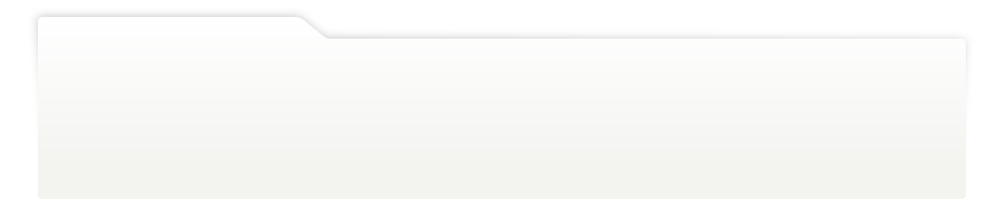
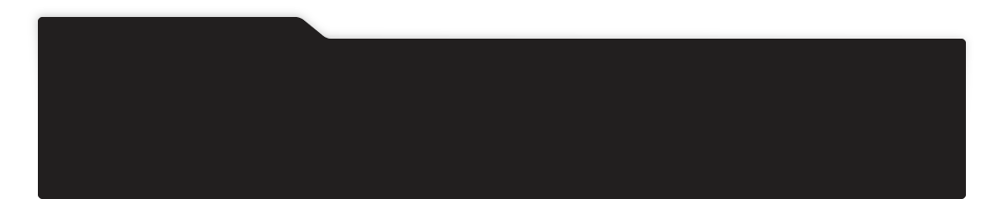
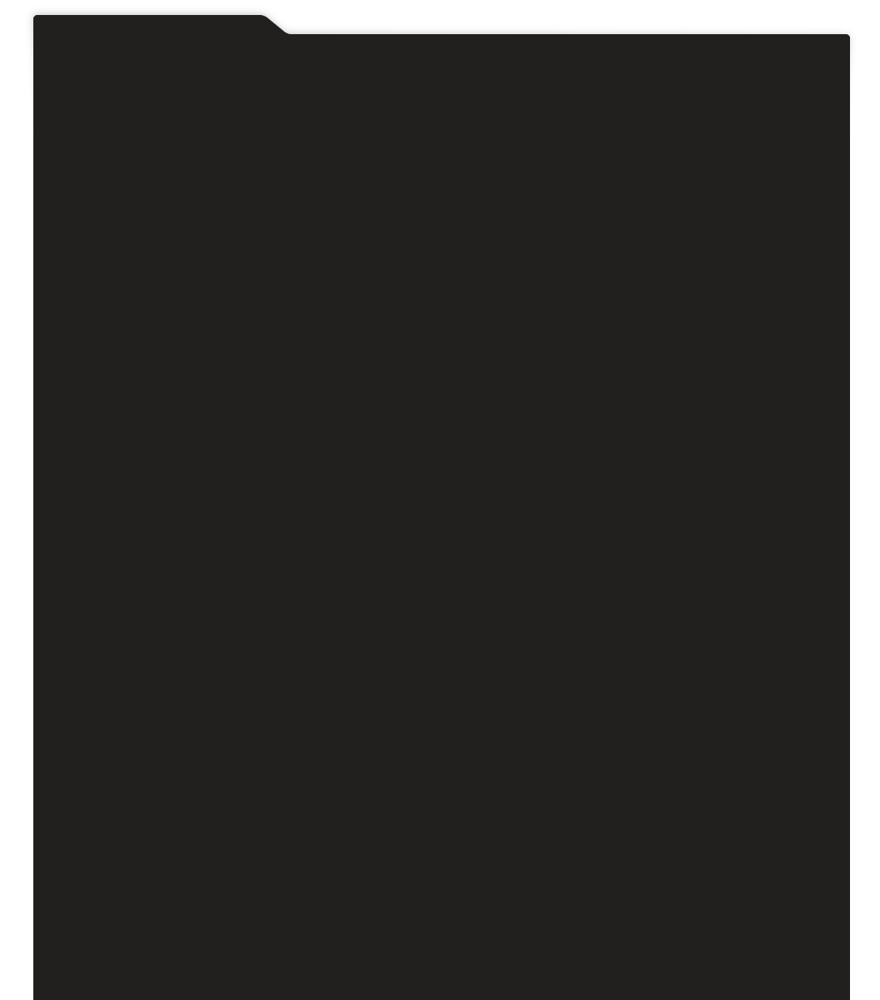
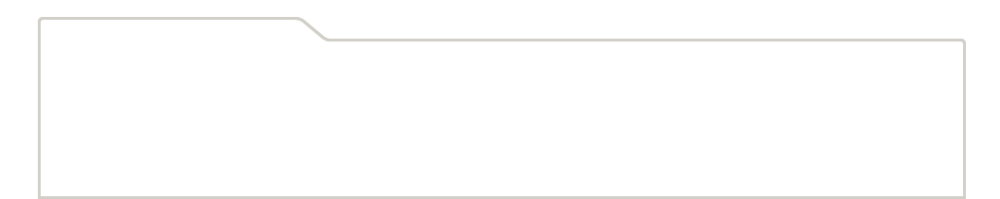
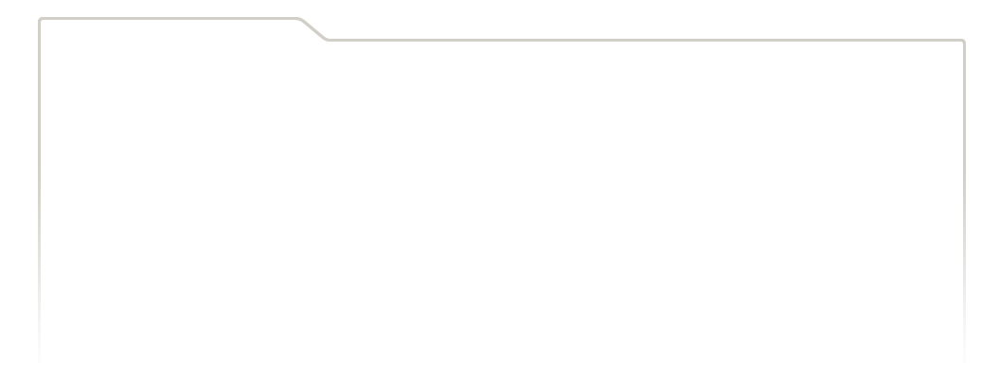
...
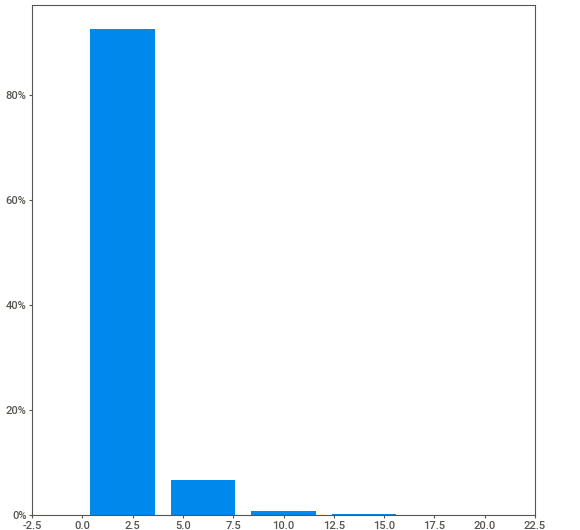
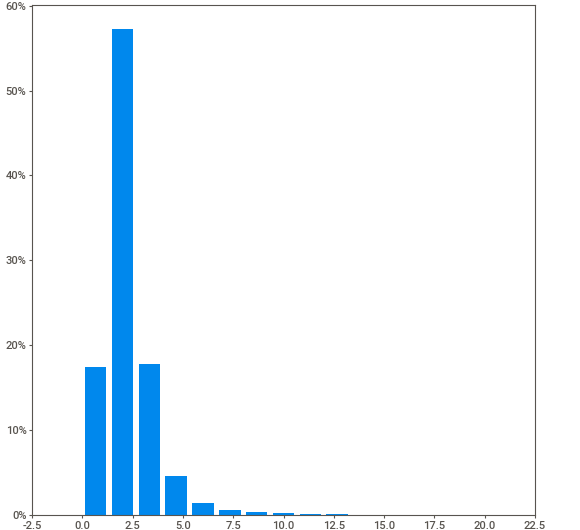
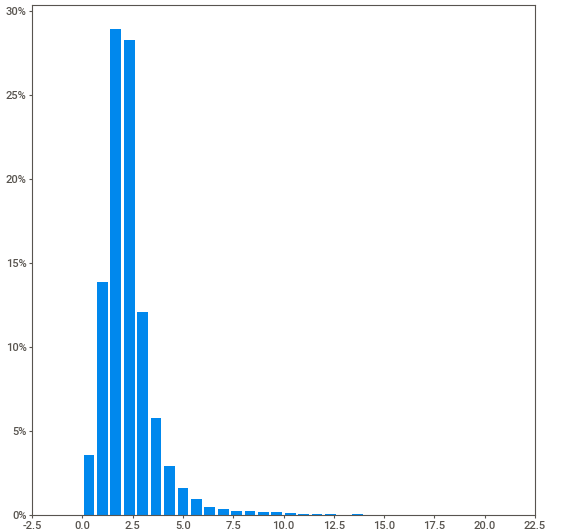
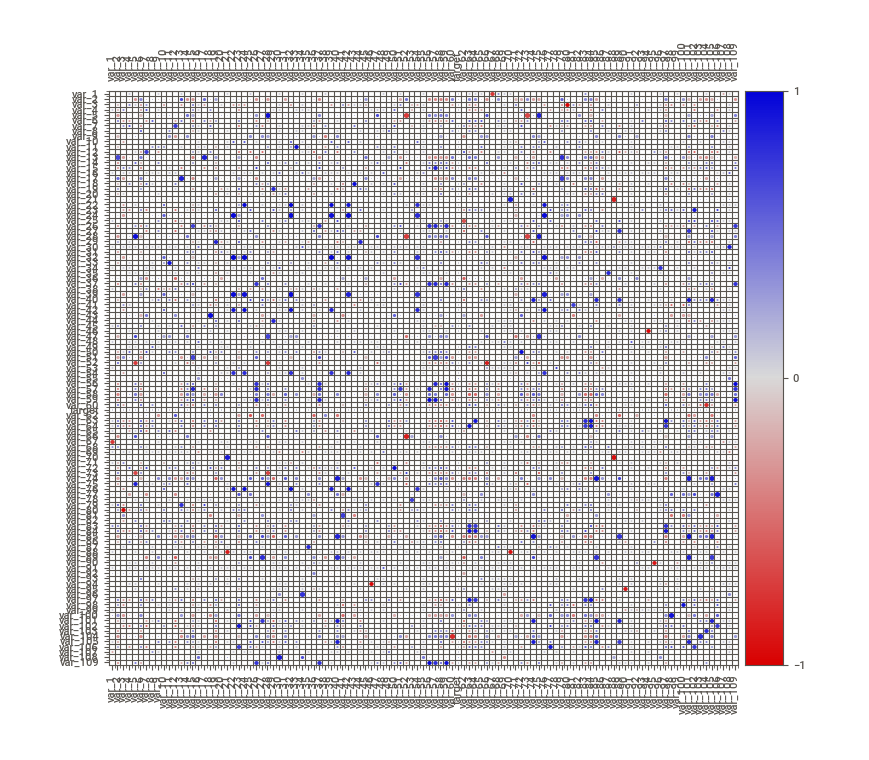
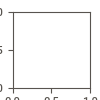

In [30]:
data_report = sv.analyze(data, pairwise_analysis=pairwise_analysis) # create the report

if (config['process_eda']['show_html'] == "False") :
    data_report.show_notebook (layout=layout, scale=scale)
else :
    data_report.show_html (layout=layout, scale=scale)